In [18]:
import src.modules.util_get_data as utl_data

In [19]:
tickers = ['META','AMZN','NFLX','GOOG']
data = utl_data.get_data_yf(tickers)

[*********************100%%**********************]  4 of 4 completed


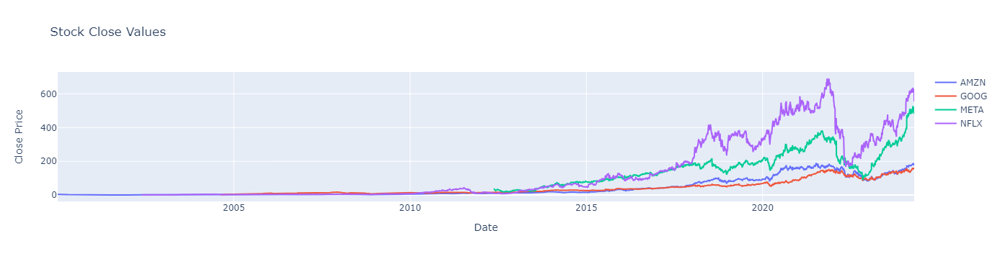

In [29]:
close_values_selected = data['Close']

import plotly.graph_objects as go

# Assuming close_values_selected is a DataFrame containing the close values for selected tickers
fig = go.Figure()

for ticker in close_values_selected.columns:
    fig.add_trace(go.Scatter(x=close_values_selected.index, y=close_values_selected[ticker], mode='lines', name=ticker))

fig.update_layout(title='Stock Close Values',
                  xaxis_title='Date',
                  yaxis_title='Close Price')

fig.show()

In [28]:
data['Close']

Ticker,AMZN,GOOG,META,NFLX
Date,,,,
2000-01-03,4.468750,NaN,NaN,NaN
2000-01-04,4.096875,NaN,NaN,NaN
2000-01-05,3.487500,NaN,NaN,NaN
2000-01-06,3.278125,NaN,NaN,NaN
2000-01-07,3.478125,NaN,NaN,NaN
...,...,...,...,...
2024-04-15,183.619995,156.330002,500.230011,607.150024
2024-04-16,183.320007,156.000000,499.760010,617.520020
2024-04-17,181.279999,156.880005,494.170013,613.690002


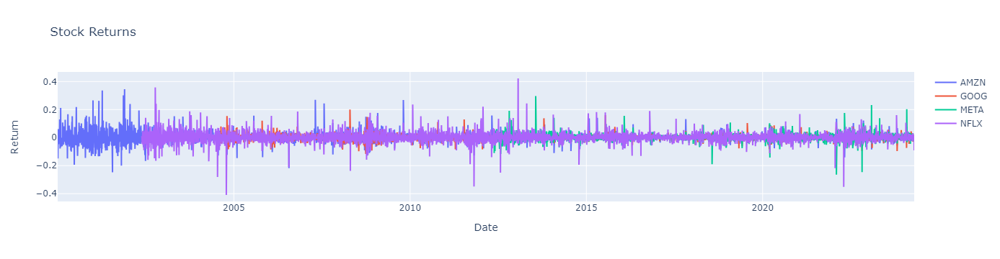

In [30]:
returns = close_values_selected.pct_change()
import plotly.graph_objects as go

# Assuming close_values_selected is a DataFrame containing the close values for selected tickers
fig = go.Figure()

for ticker in returns.columns:
    fig.add_trace(go.Scatter(x=returns.index, y=returns[ticker], mode='lines', name=ticker))

fig.update_layout(title='Stock Returns',
                  xaxis_title='Date',
                  yaxis_title='Return')

fig.show()

In [31]:
import numpy as np

# Assuming returns is a DataFrame containing the returns for selected tickers
rolling_window = 30  # You can adjust this value according to your preference

# Calculate rolling standard deviation
rolling_volatility = returns.rolling(window=rolling_window).std()

# Adjust for annualization
rolling_volatility_annualized = rolling_volatility * np.sqrt(250)

# Drop rows with NaN values
rolling_volatility_annualized = rolling_volatility_annualized.dropna()

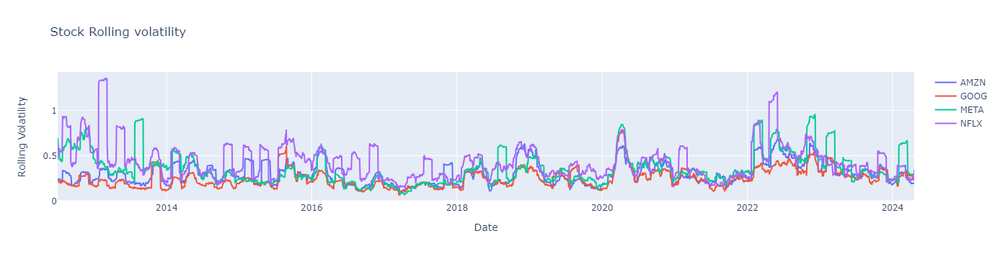

In [33]:
import plotly.graph_objects as go

# Assuming close_values_selected is a DataFrame containing the close values for selected tickers
fig = go.Figure()

for ticker in rolling_volatility_annualized.columns:
    fig.add_trace(go.Scatter(x=rolling_volatility_annualized.index, y=rolling_volatility_annualized[ticker], mode='lines', name=ticker))

fig.update_layout(title='Stock Rolling volatility',
                  xaxis_title='Date',
                  yaxis_title='Rolling Volatility')

fig.show()

In [36]:
# Assuming returns is a DataFrame containing the returns for selected tickers
rolling_window = 30  # You can adjust this value according to your preference
alpha = 0.9  # You can adjust this value according to your preference

# Calculate rolling standard deviation using exponential smoothing
rolling_volatility_ewma = returns.ewm(span=rolling_window, min_periods=rolling_window).std()

# Adjust for annualization
rolling_volatility_ewma_annualized = rolling_volatility_ewma * np.sqrt(250)

# Drop rows with NaN values
rolling_volatility_ewma_annualized = rolling_volatility_ewma_annualized.dropna()

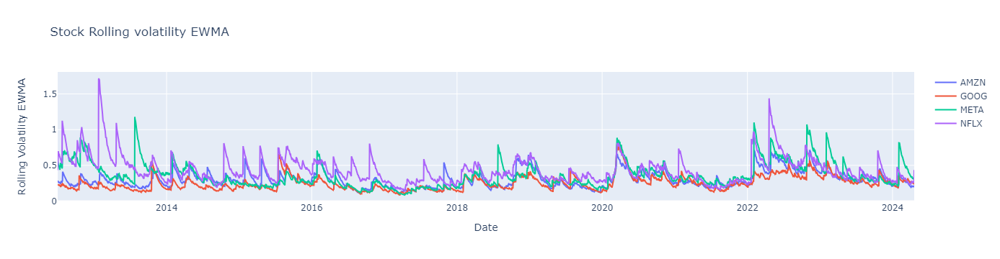

In [37]:
import plotly.graph_objects as go

# Assuming close_values_selected is a DataFrame containing the close values for selected tickers
fig = go.Figure()

for ticker in rolling_volatility_ewma_annualized.columns:
    fig.add_trace(go.Scatter(x=rolling_volatility_ewma_annualized.index, y=rolling_volatility_ewma_annualized[ticker], mode='lines', name=ticker))

fig.update_layout(title='Stock Rolling volatility EWMA',
                  xaxis_title='Date',
                  yaxis_title='Rolling Volatility EWMA')

fig.show()

In [42]:
import scipy.stats as stats

# Assuming alpha = 0.05 (5% significance level)
alpha = 0.05
horizon_in_days = 250
# Calculate the z-score corresponding to the significance level
z_score = stats.norm.ppf(1 - alpha)

# Adjust for the horizon of 10 days and 250 trading days in a year
horizon_adjustment = np.sqrt(horizon_in_days/250)

# Calculate the 10-day VaR for each stock
var_10_day = rolling_volatility_annualized * z_score * horizon_adjustment

print(var_10_day)

Ticker          AMZN      GOOG      META      NFLX
Date                                              
2012-07-02  0.399613  0.374453  1.144666  0.754714
2012-07-03  0.390309  0.362267  1.028338  0.802156
2012-07-05  0.388693  0.354931  0.936246  0.978485
2012-07-06  0.390277  0.355814  0.924502  0.940442
2012-07-09  0.386821  0.353503  0.913811  0.931192
...              ...       ...       ...       ...
2024-04-15  0.325853  0.424626  0.481192  0.395376
2024-04-16  0.325332  0.395333  0.479536  0.403186
2024-04-17  0.315242  0.393241  0.476262  0.380000
2024-04-18  0.320271  0.386835  0.478500  0.380942
2024-04-19  0.332017  0.388258  0.491779  0.570288

[2969 rows x 4 columns]


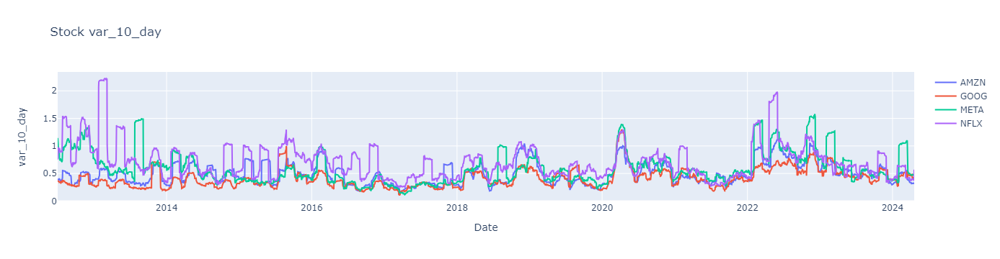

In [43]:
import plotly.graph_objects as go

# Assuming close_values_selected is a DataFrame containing the close values for selected tickers
fig = go.Figure()

for ticker in var_10_day.columns:
    fig.add_trace(go.Scatter(x=var_10_day.index, y=var_10_day[ticker], mode='lines', name=ticker))

fig.update_layout(title='Stock var_10_day',
                  xaxis_title='Date',
                  yaxis_title='var_10_day')

fig.show()